<a href="https://colab.research.google.com/github/KaviyaSriMuthaiah/Disease-Identification-Medical-Drug-Recommendation-System-/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Disease Identification, Medical Drug Recommendation and Seniment Analysis using Patient Reviews**📌🩺

**Import required libraries**


In [ ]:
from ast import increment_lineno
import pandas as pd
import itertools
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline



In [ ]:
#To show all the rows of pandas dataframe
pd.set_option('display.max_rows',None)

**Dataset Overview**

In [ ]:
df=pd.read_csv("/content/drugsComTrain_raw.tsv",sep='\t')

<ipython-input-5-a164e1b7c79c>:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("/content/drugsComTrain_raw.tsv",sep='\t')


In [ ]:
df.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37


In [ ]:
df.condition.value_counts()

condition
Birth Control                                                          28788
Depression                                                              9069
Pain                                                                    6145
Anxiety                                                                 5904
Acne                                                                    5588
Bipolar Disorde                                                         4224
Insomnia                                                                3673
Weight Loss                                                             3609
Obesity                                                                 3568
ADHD                                                                    3383
Diabetes, Type 2                                                        2554
Emergency Contraception                                                 2463
High Blood Pressure                                               

In [ ]:
df_train = df[(df['condition']=='Birth Control') | (df['condition']=='Depression') | (df['condition']=='High Blood Pressure') | (df['condition']=='Anxiety')|(df['condition']=='Allergies') | (df['condition']=='Pain')|(df['condition']=='Diabetes, Type 2')]

In [ ]:
df.shape

(161297, 7)

In [ ]:
df_train.shape

(54960, 7)

**Dataset Analysis and Visualization**

In [ ]:
x=df_train.drop(['Unnamed: 0','drugName','rating','date','usefulCount'],axis=1)
x.head()

,condition,review
2,Birth Control,"""I used to take another oral contraceptive, wh..."
3,Birth Control,"""This is my first time using any form of birth..."
9,Birth Control,"""I had been on the pill for many years. When m..."
11,Depression,"""I have taken anti-depressants for years, with..."
14,Birth Control,"""Started Nexplanon 2 months ago because I have..."


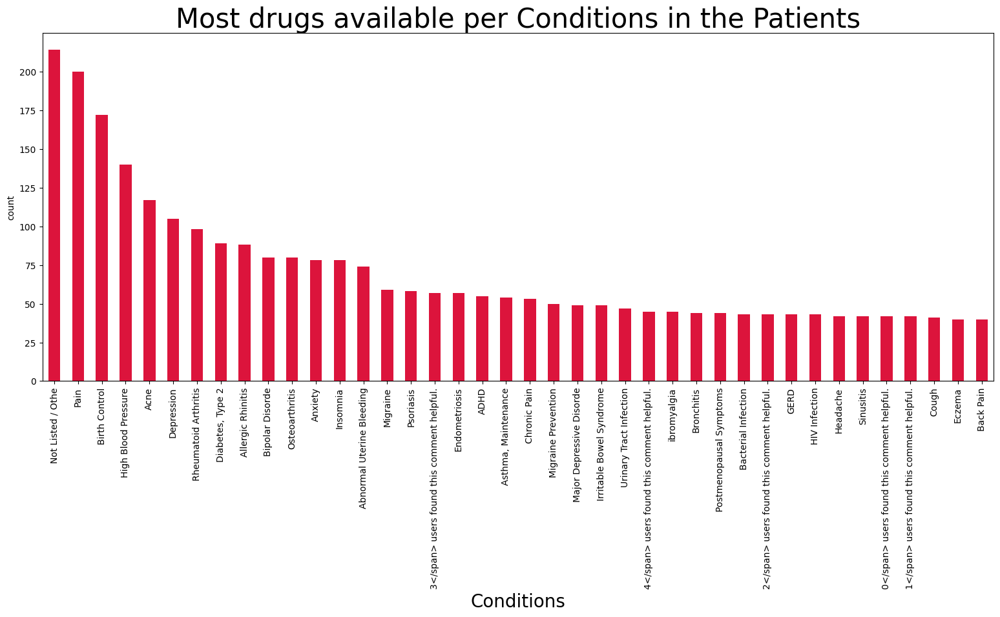

In [ ]:
df.groupby(['condition'])['drugName'].nunique().sort_values(ascending = False).head(40).plot.bar(figsize = (19, 7), color = 'crimson')
plt.title('Most drugs available per Conditions in the Patients', fontsize = 30)
plt.xlabel('Conditions', fontsize = 20)
plt.ylabel('count')
plt.show()

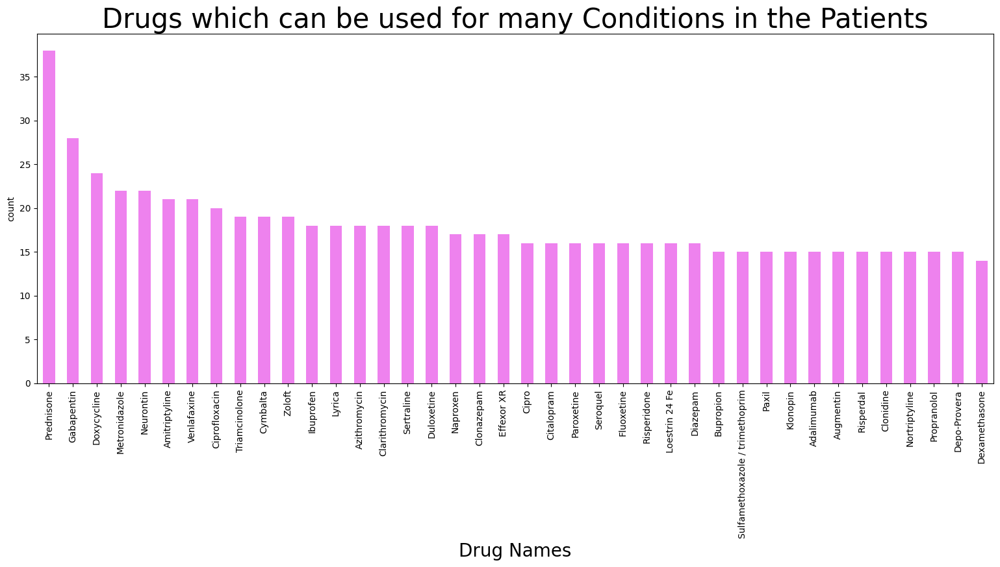

In [ ]:
# checking the most popular drugs per conditions

df.groupby(['drugName'])['condition'].nunique().sort_values(ascending = False).head(40).plot.bar(figsize = (19, 7), color = 'violet')
plt.title('Drugs which can be used for many Conditions in the Patients', fontsize = 30)
plt.xlabel('Drug Names', fontsize = 20)
plt.ylabel('count')
plt.show()

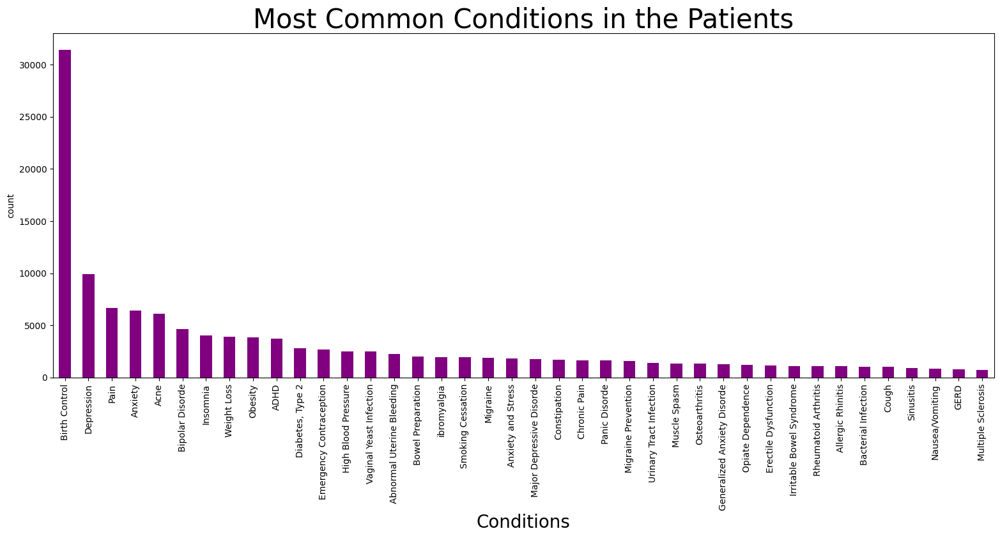

In [ ]:
# checking the different types of conditions patients


df['condition'].value_counts().head(40).plot.bar(figsize = (19, 7), color = 'purple')
plt.title('Most Common Conditions in the Patients', fontsize = 30)
plt.xlabel('Conditions', fontsize = 20)
plt.ylabel('count')
plt.show()

**Exploratory Data Analysis**


In [ ]:
x.condition.value_counts()

condition
Birth Control          31439
Depression              9886
Pain                    6693
Anxiety                 6437
Diabetes, Type 2        2793
High Blood Pressure     2517
Name: count, dtype: int64

In [ ]:
x.head()

,condition,review
2,Birth Control,"""I used to take another oral contraceptive, wh..."
3,Birth Control,"""This is my first time using any form of birth..."
9,Birth Control,"""I had been on the pill for many years. When m..."
11,Depression,"""I have taken anti-depressants for years, with..."
14,Birth Control,"""Started Nexplanon 2 months ago because I have..."


In [ ]:
#segragating dataframe for analyzing individual condition
x_birth=x[(x['condition']=='Birth Control')]
x_depression=x[(x['condition']=='Depression')]
x_pain=x[(x['condition']=='Pain')]
x_anxiety=x[(x['condition']=='Anxiety')]
x_diabetes=x[(x['condition']=='Diabetes, Type 2')]
x_bp=x[(x['condition']=='High Blood Pressure')]
x_allergies=x[(x['condition']=='Allergies')]

Text(0.5, 1.0, 'Word Cloud for Birth Control')

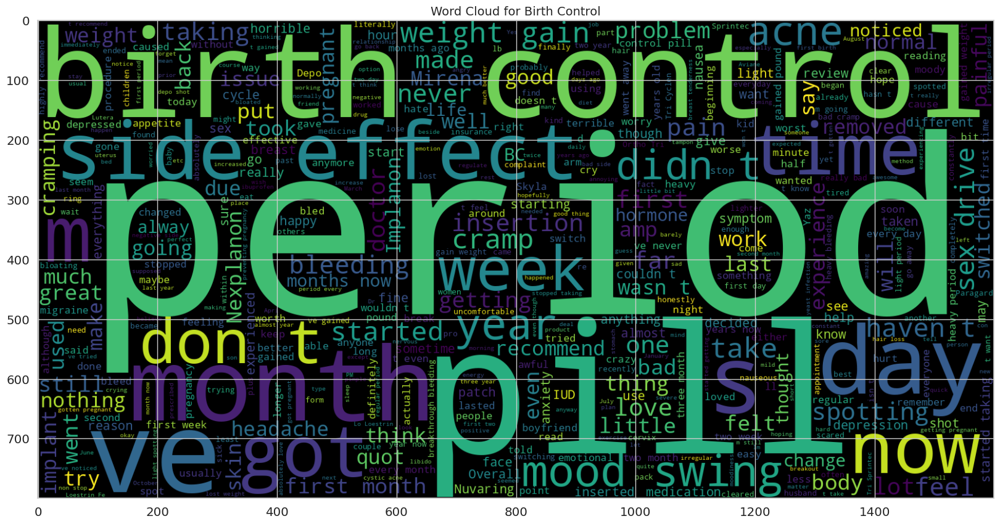

In [ ]:
from wordcloud import WordCloud
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=500,width=1600,height=800).generate(" ".join(x_birth.review))
plt.imshow(wc, interpolation='bilinear')
plt.title('Word Cloud for Birth Control',fontsize=14)

Text(0.5, 1.0, 'Word Cloud for Depression')

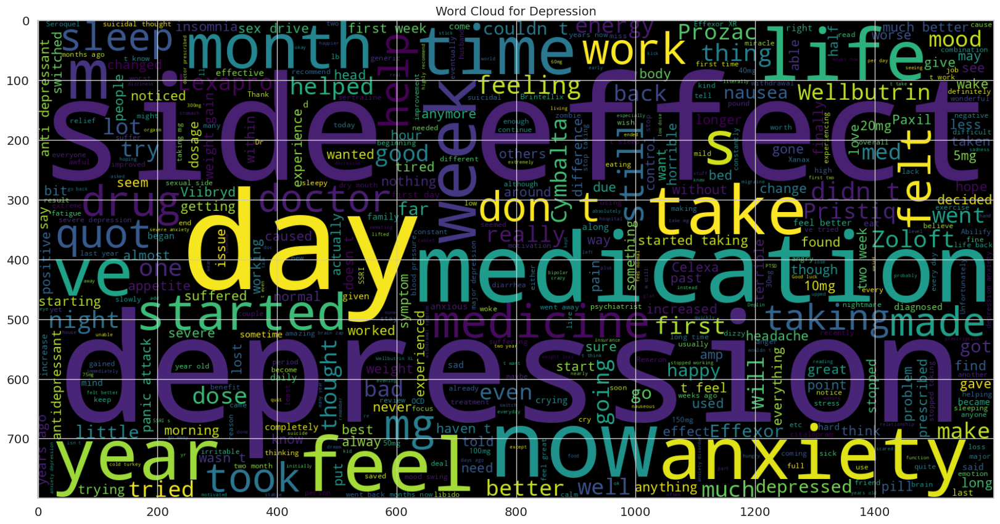

In [ ]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=500,width=1600,height=800).generate(" ".join(x_depression.review))
plt.imshow(wc, interpolation='bilinear')
plt.title('Word Cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word Cloud for Pain')

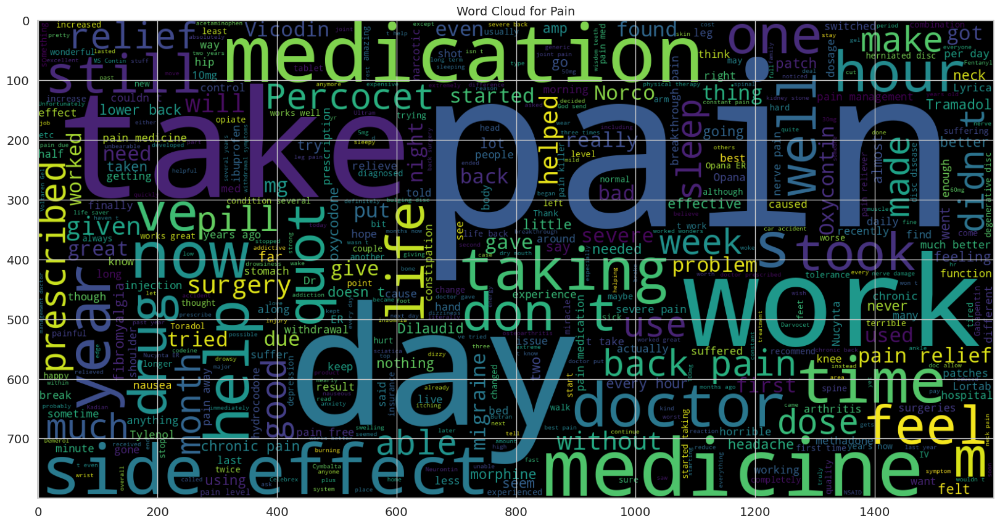

In [ ]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=500,width=1600,height=800).generate(" ".join(x_pain.review))
plt.imshow(wc, interpolation='bilinear')
plt.title('Word Cloud for Pain',fontsize=14)

Text(0.5, 1.0, 'Word Cloud for Anxiety')

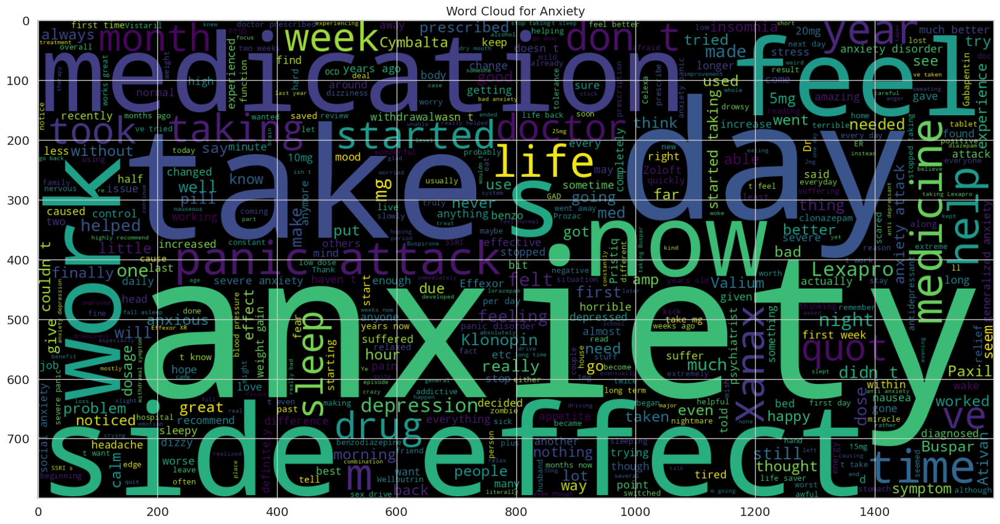

In [ ]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=500,width=1600,height=800).generate(" ".join(x_anxiety.review))
plt.imshow(wc, interpolation='bilinear')
plt.title('Word Cloud for Anxiety',fontsize=14)

Text(0.5, 1.0, 'Word Cloud for Diabetes Type-2')

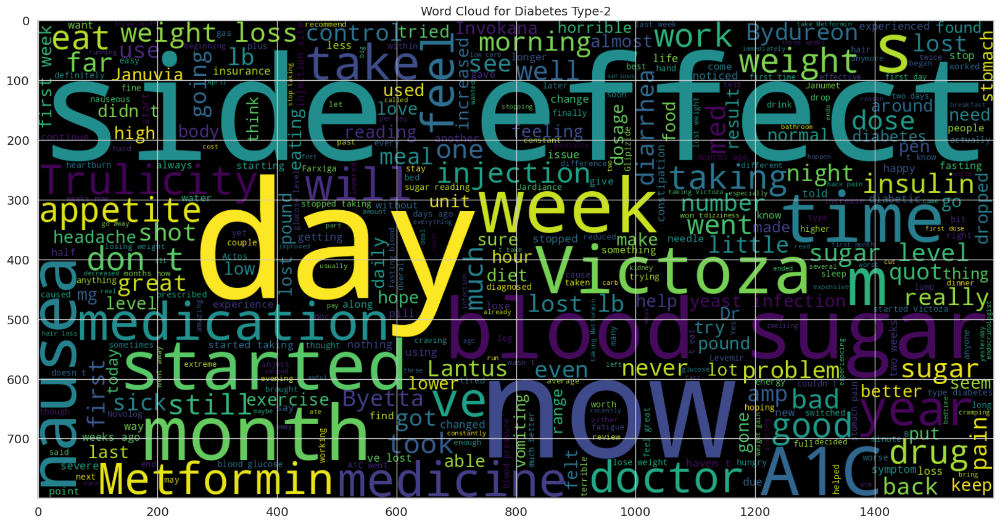

In [ ]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=400,width=1600,height=800).generate(" ".join(x_diabetes.review))
plt.imshow(wc, interpolation='bilinear')
plt.title('Word Cloud for Diabetes Type-2',fontsize=14)

Text(0.5, 1.0, 'Word Cloud for High Blood Pressure')

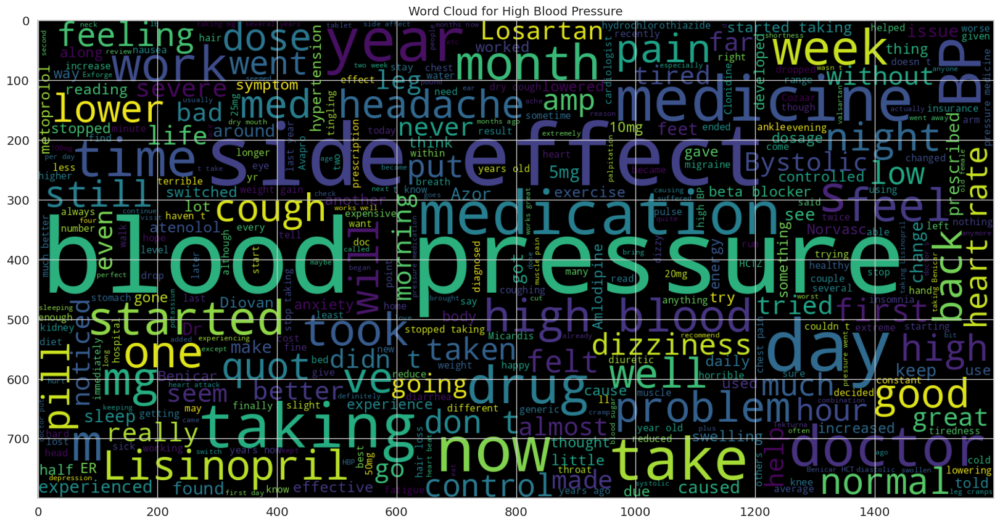

In [ ]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=400,width=1600,height=800).generate(" ".join(x_bp.review))
plt.imshow(wc, interpolation='bilinear')
plt.title('Word Cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word Cloud for Allergies')

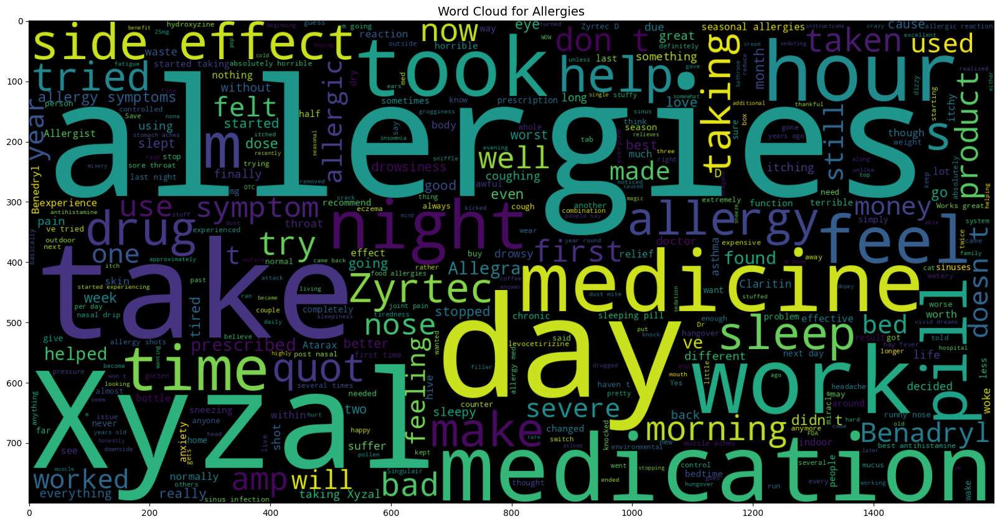

In [ ]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=400,width=1600,height=800).generate(" ".join(x_allergies.review))
plt.imshow(wc, interpolation='bilinear')
plt.title('Word Cloud for Allergies',fontsize=14)

**Data pre-processing**


In [ ]:
x['review'][2]

'"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."'

In [ ]:
x['review'][11]

'"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."'

In [ ]:
for i,col in enumerate(x.columns):
  x.iloc[:,i] = x.iloc[:,i].str.replace('"','')

In [ ]:
pd.set_option('max_colwidth',-1)

In [ ]:
x.head()

,condition,review
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger."
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."
14,Birth Control,"Started Nexplanon 2 months ago because I have a minimal amount of contraception&#039;s I can take due to my inability to take the hormone that is used in most birth controls. I&#039;m trying to give it time because it is one of my only options right now. But honestly if I had options I&#039;d get it removed.\r\nI&#039;ve never had acne problems in my life, and immediately broke out after getting it implanted. Sex drive is completely gone, and I used to have sex with my boyfriend a few days a week, now its completely forced and not even fun for me anymore. I mean I&#039;m on birth control because I like having sex but don&#039;t want to get pregnant, why take a birth control that takes away sex? Very unhappy and hope that I get it back with time or I&#039;m getting it removed."


**Stopwords Removal**


In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.corpus import stopwords

stop = stopwords.words('english')

In [ ]:
stop

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

**Lemmatization**

In [ ]:
from bs4 import BeautifulSoup
import re
from nltk.stem import WordNetLemmatizer

# Initialize the WordNet lemmatizer
lemmatizer = WordNetLemmatizer()

In [ ]:
def review_to_words(raw_review):
  #Delete HTML
  review_text = BeautifulSoup(raw_review,'html.parser').get_text()
  #Make a space
  letters_only = re.sub('[^a-zA-Z]',' ',review_text)
  #Lower letters
  words=letters_only.lower().split()
  #Stopwords
  meaningful_words=[w for w in words if not w in stop]
  #Lemmitization
  lemmatize_words=[lemmatizer.lemmatize(w) for w in meaningful_words]
  #Space join words
  return(' '.join(lemmatize_words))

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
x['review_clean']=x['review'].apply(review_to_words)

<ipython-input-38-ebba120eff61>:3: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review,'html.parser').get_text()


In [ ]:
x.head()

,condition,review,review_clean
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",used take another oral contraceptive pill cycle happy light period max day side effect contained hormone gestodene available u switched lybrel ingredient similar pill ended started lybrel immediately first day period instruction said period lasted two week taking second pack two week third pack thing got even worse third period lasted two week end third week still daily brown discharge positive side side effect idea period free tempting ala
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",first time using form birth control glad went patch month first decreased libido subsided downside made period longer day exact used period day max also made cramp intense first two day period never cramp using birth control happy patch
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger.",pill many year doctor changed rx chateal effective really help completely clearing acne take month though gain extra weight develop emotional health issue stopped taking bc started using natural method birth control started take bc hate acne came back age really hope symptom like depression weight gain begin affect older also naturally moody may worsen thing negative mental rut today also hope push edge believe depressed hopefully like younger
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects.",taken anti depressant year improvement mostly moderate severe side affect make go take cymbalta mostly pain began deplin noticed major improvement overnight energy better disposition sinking low low major depression taking month feel like normal person first time ever best thing side effect
14,Birth Control,"Started Nexplanon 2 months ago because I have a minim

**Create Features and Target Variable**

In [ ]:
x_feat=x['review_clean']
y=x['condition']

In [ ]:
x_train, x_test, y_train, y_test=train_test_split(x_feat,y,stratify=y,test_size=0.2,random_state=0)

**Vectorization**

In [ ]:
count_vectorizer=CountVectorizer(stop_words='english')
count_train=count_vectorizer.fit_transform(x_train)
count_test=count_vectorizer.transform(x_test)

**Machine Learning Models:**
1. **Naive Bayes**

In [ ]:
import numpy as np
import itertools
import matplotlib.pyplot as plt

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized Confusion Matrix")
    else:
        print("Confusion matrix, without normalization")

    thresh = cm.max() / 2  # fix the typo: should be a comma, not a semicolon

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):  # fix the typo: change ',' to 'in'
        plt.text(j, i, format(cm[i, j], '.2f' if normalize else 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

accuracy: 0.927
Confusion matrix, without normalization


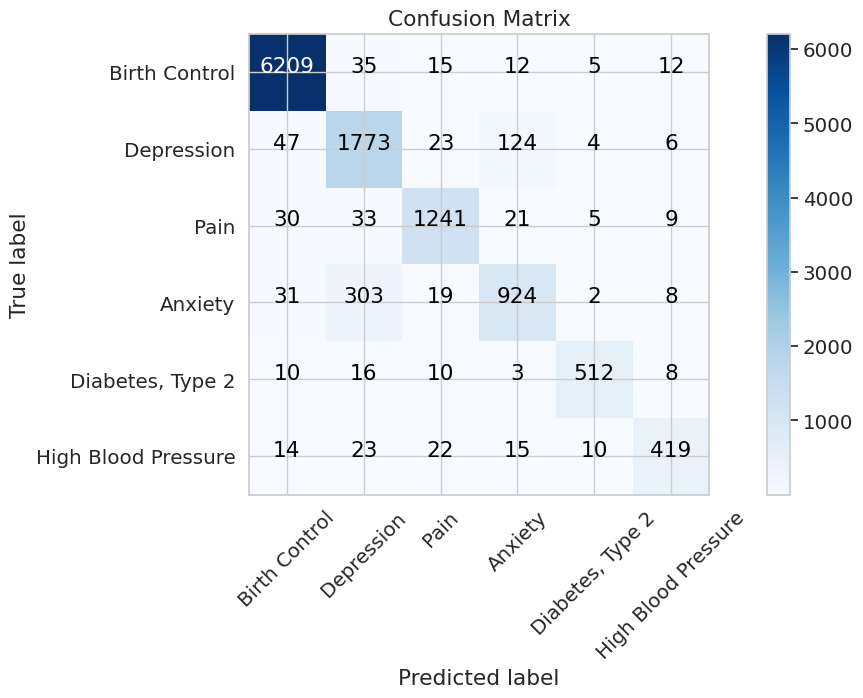

In [ ]:
# from sklearn.metrics import plot_confusion_matrix
mnb=MultinomialNB()
mnb.fit(count_train,y_train)
pred=mnb.predict(count_test)
score=metrics.accuracy_score(y_test, pred)
print("accuracy: %0.3f" % score)

cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])

2. **Passive Aggressive Classifier**

accuracy: 0.939
Confusion matrix, without normalization


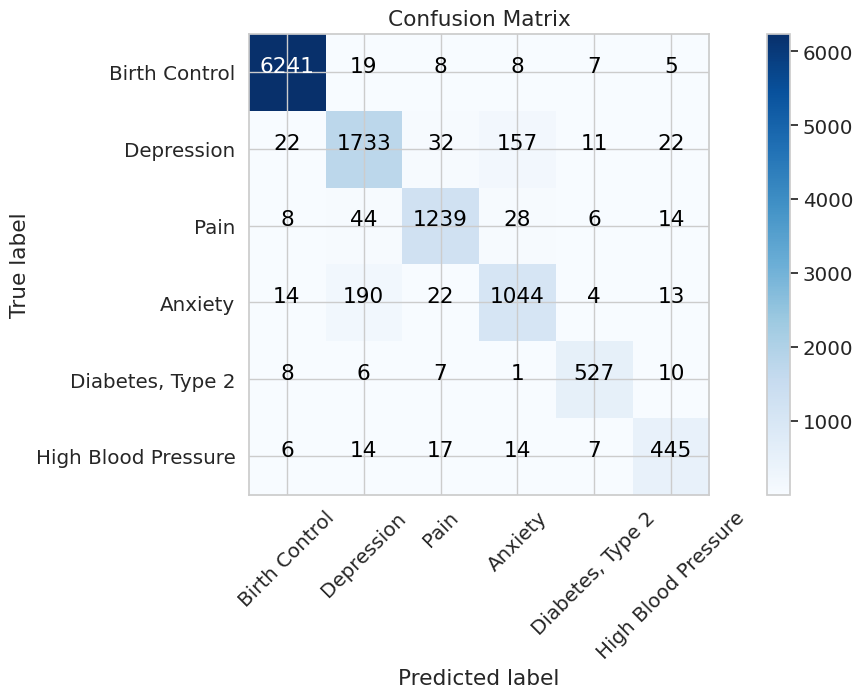

In [ ]:
from sklearn.linear_model import PassiveAggressiveClassifier,LogisticRegression

passive=PassiveAggressiveClassifier()
passive.fit(count_train, y_train)
pred=passive.predict(count_test)
score=metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])

**TFIDF - Unigram**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer=TfidfVectorizer(stop_words='english',max_df=0.8)
tfidf_train_1=tfidf_vectorizer.fit_transform(x_train)
tfidf_test_1=tfidf_vectorizer.transform(x_test)

**Machine Learning Models:**
1. **Naive Bayes**

accuracy: 0.856
Confusion matrix, without normalization


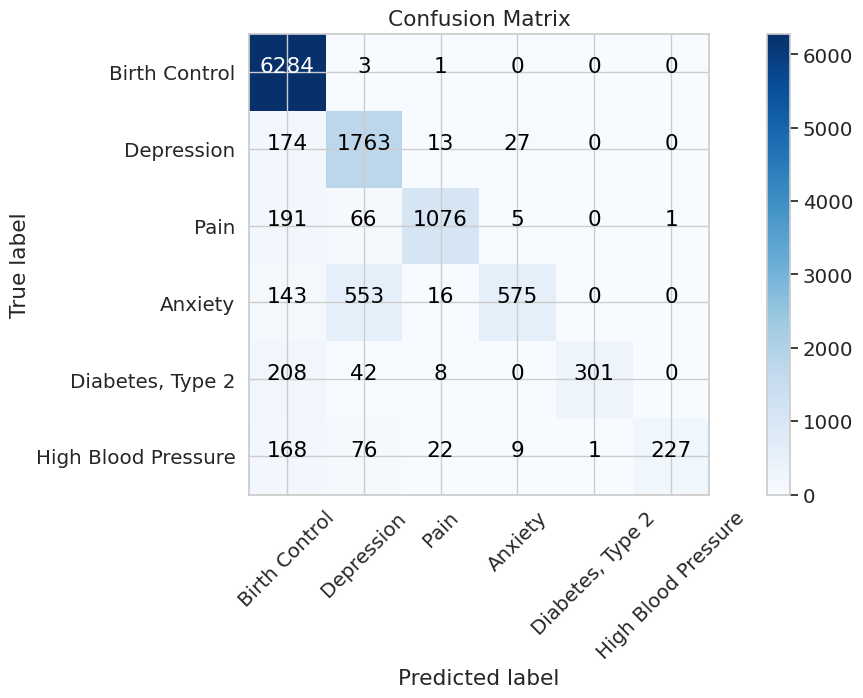

In [ ]:
# from sklearn.metrics import plot_confusion_matrix
mnb_tf=MultinomialNB()
mnb_tf.fit(tfidf_train_1,y_train)
pred=mnb_tf.predict(tfidf_test_1)
score=metrics.accuracy_score(y_test, pred)
print("accuracy: %0.3f" % score)

cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])

Accuracy: 0.841


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.859
Recall: 0.841
F1 Score: 0.825
Confusion Matrix:
[[5754    2    1    0    0    0    0]
 [ 207 1585    7   15    0    0    0]
 [ 190   69  966    3    0    1    0]
 [ 144  530    5  502    0    0    0]
 [ 219   33   12    0  247    0    0]
 [ 165   84   11   10    2  192    0]
 [   7   14    9    6    0    0    0]]
Confusion matrix, without normalization


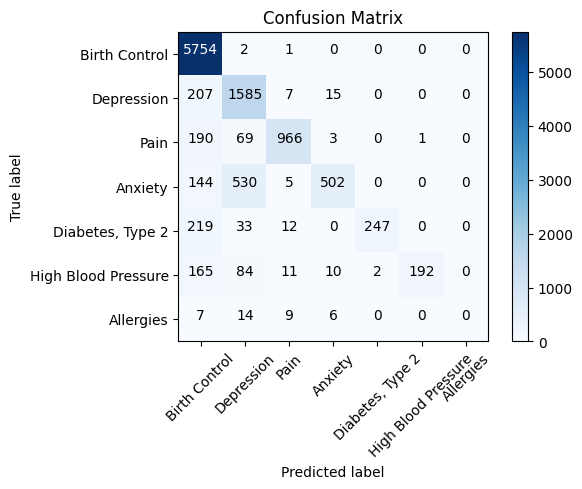

In [ ]:
from sklearn import metrics
from sklearn.naive_bayes import MultinomialNB

# Assuming you have already defined tfidf_train_1, tfidf_test_1, and y_train

mnb_tf = MultinomialNB()
mnb_tf.fit(tfidf_train_1, y_train)
pred = mnb_tf.predict(tfidf_test_1)

# Calculate accuracy
accuracy = metrics.accuracy_score(y_test, pred)
print("Accuracy: %0.3f" % accuracy)

# Calculate precision, recall, and F1 score
precision = metrics.precision_score(y_test, pred, average='weighted')
recall = metrics.recall_score(y_test, pred, average='weighted')
f1_score = metrics.f1_score(y_test, pred, average='weighted')

print("Precision: %0.3f" % precision)
print("Recall: %0.3f" % recall)
print("F1 Score: %0.3f" % f1_score)

# Compute confusion matrix
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])


accuracy: 0.948
Confusion matrix, without normalization


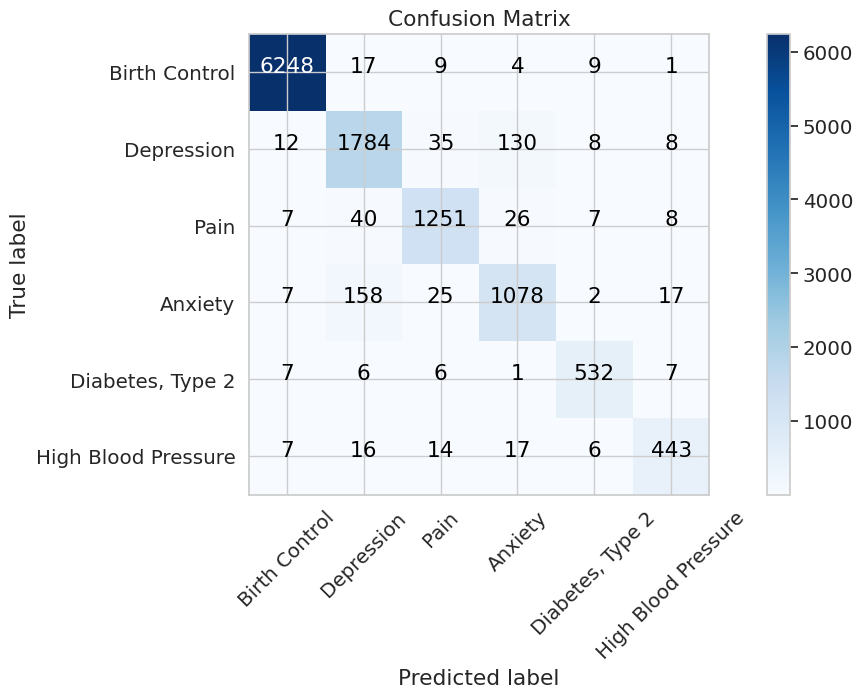

In [ ]:
passive_tf=PassiveAggressiveClassifier()
passive_tf.fit(tfidf_train_1, y_train)
pred=passive_tf.predict(tfidf_test)
score=metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])

Accuracy: 0.942
Precision: 0.942
Recall: 0.942
F1 Score: 0.942
Confusion Matrix:
[[5726   13    4    6    5    3    0]
 [  11 1611   23  152    7    8    2]
 [  14   37 1143   23    6    5    1]
 [   9  164   17  976    1   14    0]
 [   4    7    5    5  481    9    0]
 [  13   30   18    9    6  388    0]
 [   0    0    2    2    0    0   32]]
Confusion matrix, without normalization


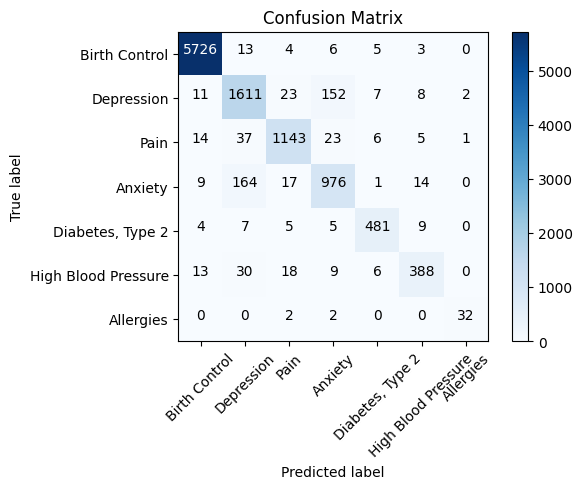

In [ ]:
from sklearn import metrics
from sklearn.linear_model import PassiveAggressiveClassifier

# Assuming you have already defined tfidf_train, tfidf_test, and y_train

passive_tf = PassiveAggressiveClassifier()
passive_tf.fit(tfidf_train_1, y_train)
pred = passive_tf.predict(tfidf_test)

# Calculate accuracy
accuracy = metrics.accuracy_score(y_test, pred)
print("Accuracy: %0.3f" % accuracy)

# Calculate precision, recall, and F1 score
precision = metrics.precision_score(y_test, pred, average='weighted')
recall = metrics.recall_score(y_test, pred, average='weighted')
f1_score = metrics.f1_score(y_test, pred, average='weighted')

print("Precision: %0.3f" % precision)
print("Recall: %0.3f" % recall)
print("F1 Score: %0.3f" % f1_score)

# Compute confusion matrix
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])


**TFIDF-Bigrams**

In [ ]:
tfidf_vectorizer2=TfidfVectorizer(stop_words='english',max_df=0.8,ngram_range=(1,2))
tfidf_train_2=tfidf_vectorizer2.fit_transform(x_train)
tfidf_test_2=tfidf_vectorizer2.transform(x_test)

accuracy: 0.962
Confusion matrix, without normalization


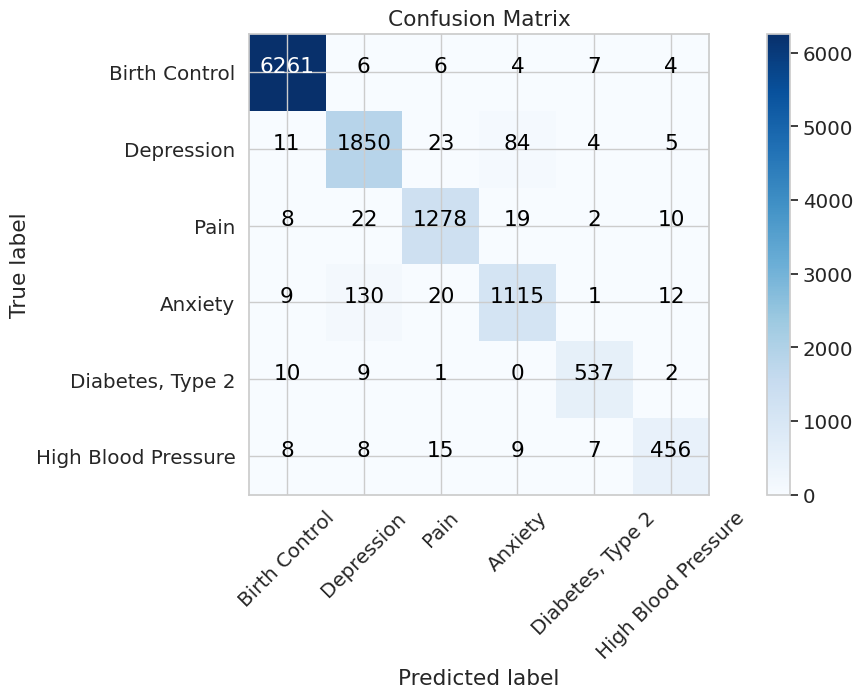

In [ ]:
passive_tf=PassiveAggressiveClassifier()
passive_tf.fit(tfidf_train_2, y_train)
pred=passive_tf.predict(tfidf_test_2)
score=metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])

Accuracy: 0.956
Precision: 0.955
Recall: 0.956
F1 Score: 0.955
Confusion Matrix:
[[5739    1    8    5    3    1    0]
 [  15 1659   15  111    9    5    0]
 [  10   30 1170   16    2    1    0]
 [  15  135   15 1009    0    7    0]
 [   3    7    4    1  484   12    0]
 [  12   15   15    7    4  410    1]
 [   0    0    2    1    0    0   33]]
Confusion matrix, without normalization


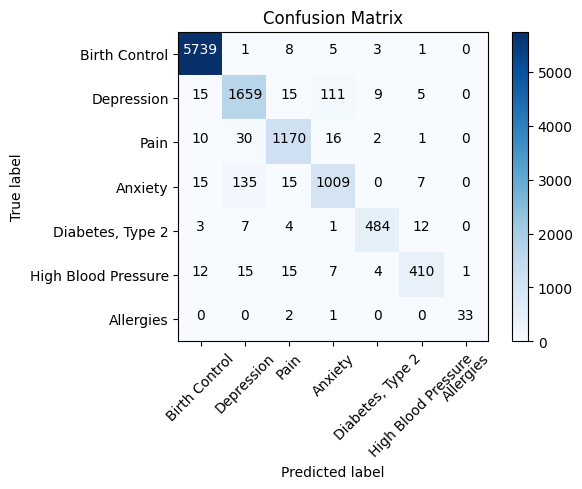

In [ ]:
from sklearn import metrics
from sklearn.linear_model import PassiveAggressiveClassifier

# Assuming you have already defined tfidf_train_2, tfidf_test_2, and y_train

passive_tf = PassiveAggressiveClassifier()
passive_tf.fit(tfidf_train_2, y_train)
pred = passive_tf.predict(tfidf_test_2)

# Calculate accuracy
accuracy = metrics.accuracy_score(y_test, pred)
print("Accuracy: %0.3f" % accuracy)

# Calculate precision, recall, and F1 score
precision = metrics.precision_score(y_test, pred, average='weighted')
recall = metrics.recall_score(y_test, pred, average='weighted')
f1_score = metrics.f1_score(y_test, pred, average='weighted')

print("Precision: %0.3f" % precision)
print("Recall: %0.3f" % recall)
print("F1 Score: %0.3f" % f1_score)

# Compute confusion matrix
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])


**TFIDF-Trigrams**

In [ ]:
tfidf_vectorizer3=TfidfVectorizer(stop_words='english',max_df=0.8,ngram_range=(1,3))
tfidf_train_3=tfidf_vectorizer3.fit_transform(x_train)
tfidf_test_3=tfidf_vectorizer3.transform(x_test)

accuracy: 0.963
Confusion matrix, without normalization


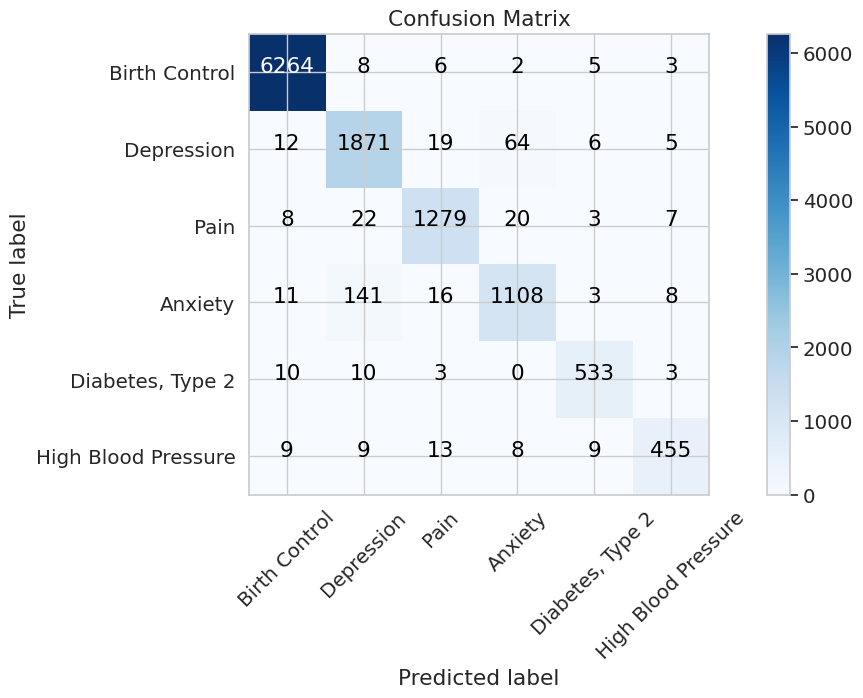

In [ ]:
passive_tf=PassiveAggressiveClassifier()
passive_tf.fit(tfidf_train_3, y_train)
pred=passive_tf.predict(tfidf_test_3)
score=metrics.accuracy_score(y_test,pred)
print("accuracy: %0.3f" % score)
cm=metrics.confusion_matrix(y_test,pred,labels=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])
plot_confusion_matrix(cm,classes=['Birth Control','Depression','Pain','Anxiety','Diabetes, Type 2','High Blood Pressure','Allergies'])

Accuracy: 0.957
Precision: 0.957
Recall: 0.957
F1 Score: 0.957
Confusion Matrix:
[[5736    2    8    5    5    1    0]
 [  14 1674   15   97    9    5    0]
 [  11   30 1165   17    4    2    0]
 [  16  121   11 1023    0   10    0]
 [   5    9    6    1  485    5    0]
 [  13   17   14   10    4  405    1]
 [   0    0    1    1    0    0   34]]
Confusion matrix, without normalization


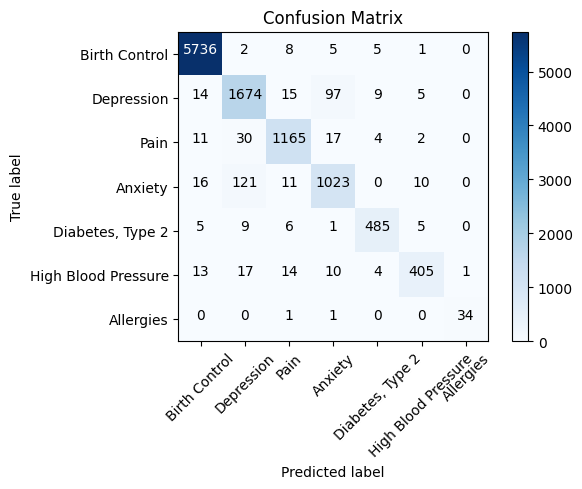

In [ ]:
from sklearn import metrics

passive_tf = PassiveAggressiveClassifier()
passive_tf.fit(tfidf_train_3, y_train)
pred = passive_tf.predict(tfidf_test_3)

# Calculate accuracy
accuracy = metrics.accuracy_score(y_test, pred)
print("Accuracy: %0.3f" % accuracy)

# Calculate precision, recall, and F1 score
precision = metrics.precision_score(y_test, pred, average='weighted')
recall = metrics.recall_score(y_test, pred, average='weighted')
f1_score = metrics.f1_score(y_test, pred, average='weighted')

print("Precision: %0.3f" % precision)
print("Recall: %0.3f" % recall)
print("F1 Score: %0.3f" % f1_score)

# Compute confusion matrix
cm = metrics.confusion_matrix(y_test, pred, labels=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
plot_confusion_matrix(cm, classes=['Birth Control', 'Depression', 'Pain', 'Anxiety', 'Diabetes, Type 2', 'High Blood Pressure', 'Allergies'])


**Most Important Features**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
def most_informative_feature(vectorizer,classifier,classlabel,n=10):
  labelid=list(classifier.classes_).index(classlabel)
  feature_names=tfidf_vectorizer3.get_feature_names_out()
  topn=sorted(zip(classifier.coef_[labelid],feature_names))[-n:]

  for coef, feat in topn:
    print(classlabel,feat,coef)

most_informative_feature(tfidf_vectorizer3,passive_tf,'Birth Control')

Birth Control insertion 6.079906207188524
Birth Control spotting 6.153137578844285
Birth Control cramp 6.320510329270448
Birth Control pregnant 6.599820385405122
Birth Control bleeding 6.888581866115734
Birth Control birth control 7.368543085293593
Birth Control birth 7.5832013174439385
Birth Control acne 8.176990831855155
Birth Control pill 8.496836013697058
Birth Control period 13.429234100066187


In [ ]:
most_informative_feature(tfidf_vectorizer3,passive_tf,'Depression')

Depression pristiq 4.861359185605328
Depression abilify 4.862278912193482
Depression celexa 4.977262852996298
Depression viibryd 5.36799722279059
Depression prozac 5.467068649833137
Depression zoloft 5.5374261181462066
Depression brintellix 5.99315063442619
Depression wellbutrin 6.433995740428537
Depression antidepressant 6.765279834218087
Depression depression 12.306940726625367


In [ ]:
most_informative_feature(tfidf_vectorizer3,passive_tf,'Pain')

Pain dilaudid 4.038761675302312
Pain nucynta 4.1174593877279975
Pain disc 4.172979413889653
Pain opana 4.319106054350906
Pain norco 4.717543148558747
Pain oxycontin 4.974182594445127
Pain relief 5.267822819938922
Pain percocet 5.27729305274197
Pain surgery 5.630321263525256
Pain pain 12.24802583278451


In [ ]:
most_informative_feature(tfidf_vectorizer3,passive_tf,'Anxiety')

Anxiety lorazepam 3.2864679231648375
Anxiety lexapro 3.481431040433946
Anxiety panic 3.5956084266893815
Anxiety vistaril 3.8655258004429203
Anxiety klonopin 4.38604885352389
Anxiety valium 4.512787963817849
Anxiety xanax 4.55961461737917
Anxiety ativan 5.733180958912123
Anxiety buspar 7.508630232885882
Anxiety anxiety 13.635433216587247


In [ ]:
most_informative_feature(tfidf_vectorizer3,passive_tf,'Diabetes, Type 2')

Diabetes, Type 2 number 4.4799373119871575
Diabetes, Type 2 injection 4.633291627207489
Diabetes, Type 2 glucose 4.643430679163977
Diabetes, Type 2 januvia 4.734882509522843
Diabetes, Type 2 invokana 5.425439463321984
Diabetes, Type 2 insulin 5.492506595115438
Diabetes, Type 2 trulicity 6.300054870791936
Diabetes, Type 2 victoza 7.89027049835804
Diabetes, Type 2 metformin 8.529606667276209
Diabetes, Type 2 sugar 8.846629940306846


In [ ]:
most_informative_feature(tfidf_vectorizer3,passive_tf,'High Blood Pressure')

High Blood Pressure diovan 3.408891182445927
High Blood Pressure bystolic 4.025539658717597
High Blood Pressure amlodipine 4.059425629677246
High Blood Pressure blood pressure 4.358853694626511
High Blood Pressure losartan 4.371493779679247
High Blood Pressure benicar 4.539140972318637
High Blood Pressure lisinopril 5.821423280975983
High Blood Pressure cough 5.941278716236594
High Blood Pressure pressure 6.394283896940797
High Blood Pressure bp 7.819045626246893


In [ ]:
most_informative_feature(tfidf_vectorizer3,passive_tf,'Allergies')

Allergies sleeping pill 0.9487512468541346
Allergies best antihistamine 0.9869691068939936
Allergies allergy symptom 1.2544176249847794
Allergies drowsy 1.301773728965604
Allergies make drowsy 1.4761918891876886
Allergies effect love 1.6540226436530232
Allergies zyrtec 1.757499501352976
Allergies great effect love 2.4015330276491667
Allergies xyzal 3.6812504181104453
Allergies allergy 5.5072668327015535


**Sample Predictions**

In [ ]:
x.tail()

,condition,review,review_clean
176036,"Diabetes, Type 2",I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me,got diagnosed type doctor prescribed invokana metformin beginning sugar went normal second week losing much weight side effect yet miracle medicine
176044,Depression,"This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",third med tried anxiety mild depression week hate much dizzy major diarrhea feel worse started contacting doc changing asap
176045,Anxiety,"I was super against taking medication. I&#039;ve started dealing with anxiety (some depression) for awhile now. I got prescribed Ativan months ago, and never took it. I thought I could handle myself again but then my relationship started to fail because of my over thinking. I went back to the doctor, and decided to try it. She prescribed me .50 3 times a day. I took a full one at night after a bad panic attack, and within 30 minutes I was calm and slept through the entire night. I have only been taking a half morning and mid afternoon and full at night because it does make you feel tired. My brain is in a slight fog, but nothing crazy, I still know whats going on though :) Give it a try if you are suffering. You will know after 1.",super taking medication started dealing anxiety depression awhile got prescribed ativan month ago never took thought could handle relationship started fail thinking went back doctor decided try prescribed time day took full one night bad panic attack within minute calm slept entire night taking half morning mid afternoon full night make feel tired brain slight fog nothing crazy still know whats going though give try suffering know
176048,High Blood Pressure,"I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",tekturna day effect immediate also calcium channel blocker tiazac hydrochlorothiazide put tekturna palpitation experienced diovan ugly drug opinion company produce however palpitation pretty bad diovan hour monitor ekg etc day substituting tekturna diovan palpitation
176049,Birth Control,"This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;(",would second month junel birth control year changed due spotting increased mood swing previous birth control since switch shorter period day gained major weight increased appetite switched regular exercise routine still managed drop extra lb


In [ ]:
text=['This would be my second month on Junel. I&#039;ve been on Birth Control for about 10 years now. I changed due to spotting and increased mood swings with my previous birth control. Since the switch I have had shorter periods about 2-3 days, but I have gained major weight and increased appetite. I switched up my regular exercise routine and still have not managed to drop the extra 7 lbs ;(	']
test=tfidf_vectorizer3.transform(text)
pred=passive_tf.predict(test)[0]
pred

'Depression'

In [ ]:
## Function for Extracting Top drugs

def top_drugs_extractor(condition):
    df_top = df[(df['rating']>=9)&(df['usefulCount']>=100)].sort_values(by = ['rating', 'usefulCount'], ascending = [False, False])
    drug_lst = df_top[df_top['condition']==condition]['drugName'].head(3).tolist()
    return drug_lst

def predict_text(lst_text):
    df_test = pd.DataFrame(lst_text, columns = ['test_sent'])
    df_test["test_sent"] = df_test["test_sent"].apply(review_to_words)
    tfidf_bigram = tfidf_vectorizer3.transform(lst_text)
    prediction = passive_tf.predict(tfidf_bigram)
    df_test['prediction']=prediction
    return df_test

# sample sentences for recommending drugs
sentences = [
  "I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations.",
    "This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap.",
    "I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losing so much weight. No side effects yet. Miracle medicine for me",]


tfidf_trigram = tfidf_vectorizer3.transform(sentences)


predictions = passive_tf.predict(tfidf_trigram)

for text, label in zip(sentences, predictions):
    if label=="High Blood Pressure":
        target="High Blood Pressure"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Depression":
        target="Depression"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Diabetes, Type 2":
        target="Diabetes, Type 2"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Pain":
        target="Pain"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Allergies":
        target="Allergies"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    elif label=="Anxiety":
        target="Anxiety"
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()
    else:
        target="Birth Control"
        print("text:", text, "\Condition:", target)
        top_drugs = top_drugs_extractor(label)
        print("text:", text, "\nCondition:", target)
        print("Top 3 Suggested Drugs:")
        print(top_drugs[0])
        print(top_drugs[1])
        print(top_drugs[2])
        print()

text: I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan (ugly drug in my opinion, same company produces both however). The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc. After a few days of substituting Tekturna for Diovan, there are no more palpitations. 
Condition: High Blood Pressure
Top 3 Suggested Drugs:
Losartan
Spironolactone
Aldactone

text: This is the third med I&#039;ve tried for anxiety and mild depression. Been on it for a week and I hate it so much. I am so dizzy, I have major diarrhea and feel worse than I started. Contacting my doc in the am and changing asap. 
Condition: Depression
Top 3 Suggested Drugs:
Sertraline
Zoloft
Viibryd

text: I just got diagnosed with type 2. My doctor prescribed Invokana and metformin from the beginning. My sugars went down to normal by the second week. I am losi

In [ ]:
import joblib
joblib.dump(tfidf_vectorizer3,'tfidfvectorizer.pkl')
joblib.dump(passive_tf,'passivemodel.pkl')

['passivemodel.pkl']

In [ ]:
joblib.dump(tfidf_vectorizer3,'tfidfvectorizer.pkl')

['tfidfvectorizer.pkl']

In [ ]:
vectorizer=joblib.load('tfidfvectorizer.pkl')
model=joblib.load('passivemodel.pkl')

test=model.predict(vectorizer.transform(['I have only been on Tekturna for 9 days. The effect was immediate. I am also on a calcium channel blocker (Tiazac) and hydrochlorothiazide. I was put on Tekturna because of palpitations experienced with Diovan. The palpitations were pretty bad on Diovan, 24 hour monitor by EKG etc']))
test[0]

'High Blood Pressure'